# Midterm 2

# Time Limit - 2.30 pm to 6.30 pm

# 20 + 20 - 40 Marks

### Instructions

- The exam must be submitted on D2L by 6.30pm. No exceptions here. Only a single .ipynb file

- Most Important - Your submitted code should not match a code from the internet. If it does, it is a straight 0.

- The grades for Midterm1 and Midterm2, both will be considered and i will average out the grades.

- You must submit individually You will be liable for penalties if your work matches exactly the other person in your class or from the internet. So be careful.

## Problem 1
### The relevant Dataset (CIFAR 100) have been described below.




This is a dataset of 50,000 32x32 color training images and 10,000 test images, labeled over 100 fine-grained classes that are grouped into 20 coarse-grained classes.

- Images have low resolution (32x32). 

- Data Source: https://www.cs.toronto.edu/~kriz/cifar.html

Read the website thoroughly.

The dataset can be directly fetched from Keras.io Website for easy incorporation into your code.
https://keras.io/api/datasets/cifar100/

### CIFAR-100 Image label detection of provided images

### Choose PCA+Random Forest+XGBoost And apply the techniques to the CIFAR-100 Dataset to Classify the Images.

### Apply PCA for reducing Dimensions. [5 Marks]
### Apply Random Forest with AdaBoost for model creation. [5 Marks].
### Recall or Precision Value? Which one should be optimised?? Show your optimised confusion matrix. [5 Marks]

### Download the 4 images provided on D2L. These images are of television,camel,wardrobe, and truck. Create a validation dataset using these images and predict the labels using the model of CIFAR-100 created by you as above. [5 Marks]

In [ ]:
import tensorflow as tf
from tensorflow import keras

tf.keras.datasets.cifar100.load_data(label_mode="fine")

((array([[[[255, 255, 255],
           [255, 255, 255],
           [255, 255, 255],
           ...,
           [195, 205, 193],
           [212, 224, 204],
           [182, 194, 167]],
  
          [[255, 255, 255],
           [254, 254, 254],
           [254, 254, 254],
           ...,
           [170, 176, 150],
           [161, 168, 130],
           [146, 154, 113]],
  
          [[255, 255, 255],
           [254, 254, 254],
           [255, 255, 255],
           ...,
           [189, 199, 169],
           [166, 178, 130],
           [121, 133,  87]],
  
          ...,
  
          [[148, 185,  79],
           [142, 182,  57],
           [140, 179,  60],
           ...,
           [ 30,  17,   1],
           [ 65,  62,  15],
           [ 76,  77,  20]],
  
          [[122, 157,  66],
           [120, 155,  58],
           [126, 160,  71],
           ...,
           [ 22,  16,   3],
           [ 97, 112,  56],
           [141, 161,  87]],
  
          [[ 87, 122,  41],
           [ 8

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar100.load_data()
assert x_train.shape == (50000, 32, 32, 3)
assert x_test.shape == (10000, 32, 32, 3)
assert y_train.shape == (50000, 1)
assert y_test.shape == (10000, 1)

In [ ]:
x_train = x_train.reshape(50000, 32*32*3)
x_test = x_test.reshape(10000, 32*32*3)

In [ ]:
x_train.shape

(50000, 3072)

In [ ]:
x_test.shape

(10000, 3072)

In [ ]:
from sklearn.decomposition import PCA
##to retain 95% of variance 

pca = PCA(.95)

In [ ]:
pca.fit(x_train)



PCA(n_components=0.95)

In [ ]:
pca.n_components_

202

In [ ]:
x_train = pca.transform(x_train)
x_test = pca.transform(x_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rfc1 = RandomForestClassifier(n_estimators=10)
rfc1.fit(x_train, y_train)
y_pred1=rfc1.predict(x_test)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
y_pred1

array([58,  2, 14, ..., 35, 26,  1])

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred1))

Accuracy: 0.0947


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, rfc1.predict(x_test)))

              precision    recall  f1-score   support

           0       0.09      0.45      0.15       100
           1       0.06      0.27      0.09       100
           2       0.02      0.08      0.03       100
           3       0.02      0.10      0.04       100
           4       0.04      0.16      0.06       100
           5       0.02      0.08      0.04       100
           6       0.03      0.08      0.04       100
           7       0.06      0.15      0.08       100
           8       0.03      0.07      0.04       100
           9       0.11      0.25      0.15       100
          10       0.03      0.06      0.04       100
          11       0.02      0.03      0.02       100
          12       0.04      0.08      0.05       100
          13       0.04      0.07      0.05       100
          14       0.03      0.04      0.03       100
          15       0.03      0.04      0.03       100
          16       0.12      0.14      0.13       100
          17       0.07    

In [ ]:
from numpy import sqrt 
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import numpy as np

In [ ]:
xgbc1 = xgb.XGBRFClassifier(colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [ ]:
xgbc1.fit(x_train,y_train)

preds = xgbc1.predict(x_test)

In [ ]:
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 33.259286


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, xgbc1.predict(x_test)))

              precision    recall  f1-score   support

           0       0.27      0.40      0.33       100
           1       0.19      0.19      0.19       100
           2       0.12      0.07      0.09       100
           3       0.12      0.14      0.13       100
           4       0.05      0.01      0.02       100
           5       0.04      0.03      0.03       100
           6       0.15      0.12      0.13       100
           7       0.17      0.11      0.13       100
           8       0.20      0.08      0.11       100
           9       0.22      0.27      0.24       100
          10       0.12      0.03      0.05       100
          11       0.09      0.03      0.04       100
          12       0.14      0.10      0.12       100
          13       0.12      0.09      0.10       100
          14       0.17      0.07      0.10       100
          15       0.06      0.02      0.03       100
          16       0.20      0.17      0.18       100
          17       0.12    

recall should be optimized 


In [ ]:
confusion_matrix(y_test,preds)

array([[40,  2,  0, ...,  0,  1,  0],
       [ 1, 19,  0, ...,  1,  0,  0],
       [ 1,  0,  7, ...,  0,  0,  2],
       ...,
       [ 0,  1,  1, ..., 11,  0,  0],
       [ 2,  0,  2, ...,  0,  1,  1],
       [ 1,  0,  0, ...,  1,  0, 23]])

## Problem 2

## Perform Text Classification on the tweet data about COVID19. The tweets have been pulled from Twitter and manual tagging has been done then. The relevant CSV file have been attached in D2L.

## A sample .ipynb work file for this problem have been provided with spam.csv file (File used in Class). This file contains code for TF-IDF along with Gensim LDA package to find latent topics for the tweets (Topic Modelling). 

## Top of the code file contains relevent references for the code, please go through them. Few things are missing in the code that you need to apply to complete it.

### 1. Use the original Tweet File instead of my sample spam.csv file for your work. [2 Marks]
### 2. Properly remove punctuations, stopwords and any words of length 1 or 2. [3 Marks]
### 3. Get the wordcloud (as mentioned in the code) after apply step 1 (This has not been done in the code). [2 Marks]
### 4. Change number of Topics to 20 in the Gensim LDAMulticore and draw the visualisation asshown in samplecode. [3 Marks]
### 5. Write a complete code using TF-IDF along with Random Forest Classifier to build a Tweet Sentiment classification Model.Use your own discretion to determine the relevant hyperparameters and model parameters. Make sure to provide justification while dropping a column. Remember this is a multiclass classification problem. Give the relevant precision and recall for the model.[10 Marks]


## Columns:
## 1) Location
## 2) Tweet At
## 3) Original Tweet
## 4) Sentiment (To be predicted)

In [8]:
import pandas as pd
import gensim
import nltk
import string
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [9]:
Corona_NLP_train = pd.read_csv('/content/Corona_NLP_train.csv', encoding='latin-1')

In [10]:
Corona_NLP_train.isnull().sum()

UserName            0
ScreenName          0
Location         8590
TweetAt             0
OriginalTweet       0
Sentiment           0
dtype: int64

In [11]:
Corona_NLP_train

,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative
...,...,...,...,...,...,...
41152,44951,89903,"Wellington City, New Zealand",14-04-2020,Airline pilots offering to stock supermarket s...,Neutral
41153,44952,89904,NaN,14-04-2020,Response to complaint not provided citing COVI...,Extremely Negative
41154,44953,89905,NaN,14-04-2020,You know itÂs getting tough when @KameronWild...,Positive
41155,44954,89906,NaN,14-04-2020,Is it wrong that the smell of hand sanitizer i...,Neutral


dropping columns because we need only text i.e, original tweet column to convert into vector form (others are irrelevant)

In [12]:
corona = Corona_NLP_train.drop(labels = ["UserName", "ScreenName", "Location", "TweetAt", "Sentiment"], axis = 1)


In [13]:
corona

,OriginalTweet
0,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...
1,advice Talk to your neighbours family to excha...
2,Coronavirus Australia: Woolworths to give elde...
3,My food stock is not the only one which is emp...
4,"Me, ready to go at supermarket during the #COV..."
...,...
41152,Airline pilots offering to stock supermarket s...
41153,Response to complaint not provided citing COVI...
41154,You know itÂs getting tough when @KameronWild...
41155,Is it wrong that the smell of hand sanitizer i...


In [14]:
import nltk
nltk.download('stopwords')

import gensim
from gensim import corpora, models

from pprint import pprint

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [15]:
!pip install pyLDAvis

import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import matplotlib.pyplot as plt
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


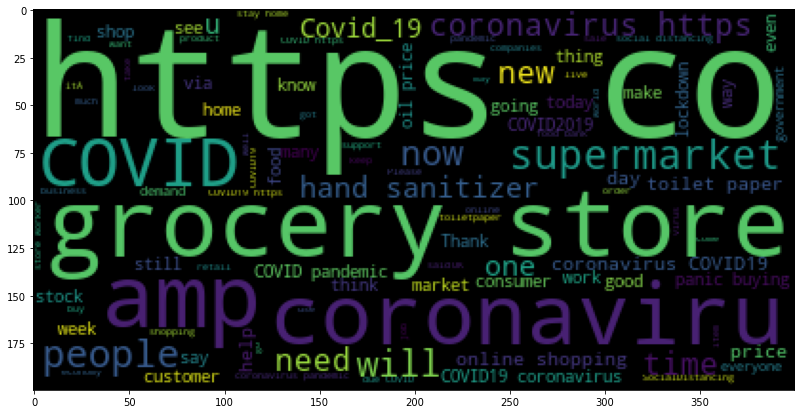

In [16]:
#word cloud visualization for the text
from wordcloud import WordCloud #visualization techniques for #frequently repeated texts
wc = WordCloud(
    background_color='black',
    max_words = 100,
    random_state = 42,
    max_font_size=110
    )

wc.generate(' '.join(corona['OriginalTweet']))
plt.figure(figsize=(50,7))
plt.imshow(wc)
plt.show()

In [17]:
stopwords = nltk.corpus.stopwords.words('english')

In [18]:
message_corpus = []
for row in range(len(corona)):
  # preprocess list of lowercase tokens and deaccentuate
  message = gensim.utils.simple_preprocess(corona.iloc[row]['OriginalTweet'],deacc=True, min_len=3, max_len=15)
  # remove stopwords and punctuations
  message = [word for word in message if word not in stopwords]
  message_corpus.append(message)

In [ ]:
len(corona)

41157

In [19]:
from gensim import corpora
# creating dictionary of tokens
dictionary = corpora.Dictionary(message_corpus)
print(dictionary)

Dictionary(78588 unique tokens: ['chrisitv', 'fan', 'ghgfzcc', 'https', 'ifz']...)


In [20]:
# creating bag-of-words corpus
bow_corpus = [dictionary.doc2bow(text) for text in message_corpus]

In [21]:
from gensim import models

In [22]:
tfidf_mod = models.TfidfModel(bow_corpus, normalize = True)

In [23]:
corpus_tfidf = tfidf_mod[bow_corpus]
for doc in corpus_tfidf:
    print(doc)

Streaming output truncated to the last 5000 lines.
[(104, 0.14254980529336336), (145, 0.1463621898593877), (267, 0.1741398668051053), (313, 0.0680756009210915), (323, 0.20795946034534976), (740, 0.13945308251631205), (904, 0.17323232659991794), (1059, 0.24154970404982556), (1249, 0.21761960536624825), (1745, 0.13429177586088184), (1819, 0.23835964847788152), (2153, 0.2379782635719757), (2882, 0.2841078714418852), (3012, 0.27954811342181385), (7750, 0.35931593503082465), (9655, 0.3459060296885939), (11883, 0.31828105185124855), (14095, 0.2906560740139033)]
[(79, 0.2856655184632202), (101, 0.14097744859259898), (107, 0.13482924292924733), (479, 0.2879860124397576), (1072, 0.2684429638641453), (1160, 0.3454108862513437), (45654, 0.7784827533417352)]
[(35, 0.036872959970298456), (83, 0.17590836187992942), (86, 0.09436083441760382), (159, 0.22800392872440944), (170, 0.19852971707391162), (313, 0.07564164263274263), (531, 0.18998217672623255), (697, 0.1535851387341946), (820, 0.1728188168184

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
[(3, 0.02062462812612117), (35, 0.02352975810469704), (50, 0.053782949669847216), (83, 0.11225248005482395), (95, 0.10716110888830295), (119, 0.08854940249319218), (168, 0.0825128188902844), (271, 0.10834262154500779), (388, 0.10643956560615561), (567, 0.15942384656566555), (956, 0.11480762061560683), (1356, 0.14875086478747565), (1459, 0.12596784418093843), (1617, 0.12956412335132553), (1983, 0.1953136386917588), (2040, 0.19206190486310576), (2608, 0.2219048022895404), (3241, 0.14279213829058537), (3610, 0.23518659252562207), (4441, 0.15683625748924931), (4611, 0.17127163279254976), (8597, 0.25477417628471527), (10163, 0.2324932307369998), (11685, 0.23518659252562207), (24333, 0.3920228500148714), (57379, 0.30025513732591325), (57380, 0.28066755356682005), (57381, 0.30025513732591325)]
[(21, 0.08949959852440664), (28, 0.08665900713093717), (35, 0.028946720712405918), (72, 0.17841501325338407), (156, 0.12501567008099504), (188, 0.10550

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
[(29, 0.1386068280310979), (50, 0.06711450573410509), (82, 0.10730445043596663), (90, 0.10230493104519828), (128, 0.13774459329858915), (264, 0.20249609192569426), (498, 0.2258862628734731), (722, 0.1530142820846847), (732, 0.1684129742605596), (820, 0.13761705737767513), (821, 0.17449845572953282), (1409, 0.18529321331827872), (2119, 0.20276425780885868), (3154, 0.1536103015186298), (4430, 0.24549094661338502), (4993, 0.23029997135036262), (7848, 0.2119355136416946), (8736, 0.22015525324995375), (13981, 0.2901229546394144), (24780, 0.2673205246919217), (69399, 0.3746814791575518), (69400, 0.3746814791575518)]
[(34, 0.03458709667473364), (52, 0.11054562577939807), (53, 0.12348737179024563), (101, 0.07627163760195477), (107, 0.07294533457307402), (431, 0.10872438598002385), (504, 0.11505232130175018), (1020, 0.223899961803382), (1056, 0.2616122021341163), (1071, 0.1553671425802512), (5158, 0.3112710096149229), (5442, 0.2394293524050234)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [24]:
lda_model = gensim.models.LdaMulticore(corpus_tfidf, 
                                       num_topics=20, 
                                       id2word = dictionary, 
                                       passes = 2, 
                                       workers=2)

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [25]:
#explore the words occuring in that topic and its relative weight
for idx, topic in lda_model.print_topics(-1):
    print("Topic: {} \nWords: {}".format(idx, topic))
    print("\n")

Topic: 0 
Words: 0.003*"https" + 0.003*"webinar" + 0.003*"covid" + 0.003*"easter" + 0.003*"consumer" + 0.002*"coronavirus" + 0.002*"grocery" + 0.002*"workers" + 0.002*"supermarket" + 0.002*"food"


Topic: 1 
Words: 0.003*"https" + 0.002*"supermarket" + 0.002*"coronavirus" + 0.002*"covid" + 0.002*"agencies" + 0.002*"futures" + 0.002*"grocery" + 0.002*"toiletpaper" + 0.002*"store" + 0.001*"people"


Topic: 2 
Words: 0.003*"ppe" + 0.003*"https" + 0.003*"ventilators" + 0.003*"sanitizer" + 0.002*"hand" + 0.002*"coronavirus" + 0.002*"commodity" + 0.002*"covid" + 0.002*"prices" + 0.002*"dies"


Topic: 3 
Words: 0.004*"https" + 0.003*"covid" + 0.003*"scams" + 0.003*"consumer" + 0.002*"coronavirus" + 0.002*"online" + 0.002*"food" + 0.002*"federal" + 0.002*"scammers" + 0.002*"shopping"


Topic: 4 
Words: 0.004*"covid" + 0.003*"sanitizer" + 0.003*"https" + 0.003*"coronavirus" + 0.003*"mask" + 0.002*"hand" + 0.002*"store" + 0.002*"food" + 0.002*"grocery" + 0.002*"online"


Topic: 5 
Words: 0.004*"

In [26]:
top_topics = lda_model.top_topics(corpus_tfidf)
num_topics = 20
avg_topic_coherence = sum([t[1] for t in top_topics]) / num_topics
print('Average topic coherence: %.4f.' % avg_topic_coherence)

from pprint import pprint
pprint(top_topics)

Average topic coherence: -5.6100.
[([(0.011576715, 'oil'),
   (0.008398844, 'prices'),
   (0.005351721, 'opec'),
   (0.0042493395, 'gas'),
   (0.003930111, 'russia'),
   (0.0037270226, 'cut'),
   (0.003579414, 'https'),
   (0.0034018233, 'demand'),
   (0.0033269092, 'low'),
   (0.0032016763, 'covid'),
   (0.002880568, 'crude'),
   (0.0027275311, 'saudi'),
   (0.0027184852, 'amid'),
   (0.0026403442, 'global'),
   (0.0026265862, 'energy'),
   (0.002479283, 'pandemic'),
   (0.002417339, 'production'),
   (0.0023265367, 'consumer'),
   (0.0022636882, 'coronavirus'),
   (0.002180388, 'due')],
  -2.500872332453856),
 ([(0.0042321896, 'supermarket'),
   (0.0039294045, 'people'),
   (0.0034109005, 'covid'),
   (0.0033462057, 'food'),
   (0.0028701741, 'get'),
   (0.002781554, 'coronavirus'),
   (0.0027666287, 'amp'),
   (0.0026976583, 'shopping'),
   (0.0026480677, 'grocery'),
   (0.0024837856, 'prices'),
   (0.0024705552, 'home'),
   (0.0024612253, 'store'),
   (0.0024087187, 'https'),
   (0

In [27]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus_tfidf))  
# a measure of how good the model is. lower the better.



Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt


Perplexity:  -12.713567176549978


In [ ]:
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus_tfidf, dictionary)
vis

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
15     0.116768 -0.026988       1        1  9.971352
19     0.113327 -0.027081       2        1  9.485055
5      0.083990 -0.022815       3        1  7.370381
4      0.078910  0.049948       4        1  6.671852
10     0.065177 -0.022724       5        1  6.619383
7      0.072419 -0.048273       6        1  6.559321
2      0.009310  0.184958       7        1  5.357876
11     0.041689  0.000320       8        1  5.257491
12     0.007524  0.046540       9        1  4.630311
9      0.001226 -0.029907      10        1  4.498388
18    -0.022509  0.004235      11        1  4.159798
1     -0.011834  0.006798      12        1  4.093388
13    -0.013888 -0.020872      13        1  4.010449
3     -0.030749  0.011023      14        1  3.811294
17    -0.031554 -0.036421      15        1  3.734087
8     -0.083698 -0.013355      16        1  2.910678
16    -0.099859  0.007460      17        1  2.810053
6     -0.089854 -0.037427      18        1  2.808449
0     -0.088583 -0.018178      19        1  2.777666
14    -0.117810 -0.007240      20        1  2.462729, topic_info=              Term        Freq       Total Category  logprob  loglift
1745           oil  176.000000  176.000000  Default  30.0000  30.0000
1327         scams   63.000000   63.000000  Default  29.0000  29.0000
621        workers  212.000000  212.000000  Default  28.0000  28.0000
10423       easter   46.000000   46.000000  Default  27.0000  27.0000
2838          opec   37.000000   37.000000  Default  26.0000  26.0000
...            ...         ...         ...      ...      ...      ...
35           covid    5.031907  475.943005  Topic20  -6.6238  -0.8456
1442   toiletpaper    4.280653  146.958674  Topic20  -6.7855   0.1679
107          store    4.209461  329.480956  Topic20  -6.8023  -0.6563
101        grocery    3.806437  333.446763  Topic20  -6.9029  -0.7689
207       consumer    3.753288  319.120638  Topic20  -6.9170  -0.7390

[1446 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
11108      2  0.148679     abcnews
11108      3  0.148679     abcnews
11108     18  0.594716     abcnews
21717     18  0.900252       abuja
17123     10  0.301425  accelerate
...      ...       ...         ...
4855      11  0.050107       wuhan
4855      12  0.350748       wuhan
4855      13  0.050107       wuhan
4855      17  0.050107       wuhan
5992       3  0.974578        zone

[3698 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[16, 20, 6, 5, 11, 8, 3, 12, 13, 10, 19, 2, 14, 4, 18, 9, 17, 7, 1, 15])

In [28]:
tfidf_mod = models.TfidfModel(bow_corpus, normalize = True)

In [29]:
# transforming bag of words corpus to tfidf corpus
tfidf_vector = gensim.interfaces.TransformedCorpus(tfidf_mod, bow_corpus)

In [30]:
len(tfidf_vector)

41157

In [31]:
from gensim import matutils
# transforming gensim corpus to sparse matrix
X_tfidf = matutils.corpus2csc(tfidf_vector)

In [ ]:
# transforming sparse matrix to dataframe
import pandas as pd
X_featurestfidf = pd.DataFrame(X_tfidf.toarray()).transpose()

In [ ]:
X_featurestfidf

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import datasets
#Import train_test_split function
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
# splitting into training and testing
X_traintfidf, X_testtfidf, y_traintfidf, y_testtfidf = train_test_split(X_featurestfidf, corona['OrinialTweet'], test_size=0.3, random_state = 101)

In [ ]:
from matplotlib import rc_file
rf = RandomForestClassifier(n_estimators=50,
                         learning_rate=0.5, random_state = 101)
# Train RandomForestClassifier Classifer
mod1 = rf.fit(X_traintfidf, y_traintfidf)

#Predict the response for test dataset
y_pred = mod1.predict(X_testtfidf)

In [ ]:
# Model Accuracy
print("Accuracy:",metrics.accuracy_score(y_testtfidf, y_pred))

In [ ]:
print(metrics.classification_report(y_testtfidf, y_pred))